#Task 1: Data Understanding and Visualization:
Download the Provided Data and Complete the following task.

1. Load and visualize images from a dataset stored in directories, where each subdirec-
tory represents a class. You are expected to write a code:

• Get the list of class directories from the train folder.
• Select one image randomly from each class.
• Display the images in a grid format with two rows using matplotlib.

In [6]:
import zipfile, os, random
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.layers import (Conv2D, BatchNormalization, Activation,
                                     MaxPooling2D, Dropout, Flatten, Dense,
                                     GlobalAveragePooling2D)
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16
from tensorflow.keras.optimizers import Adam
from PIL import Image, UnidentifiedImageError
from sklearn.metrics import classification_report

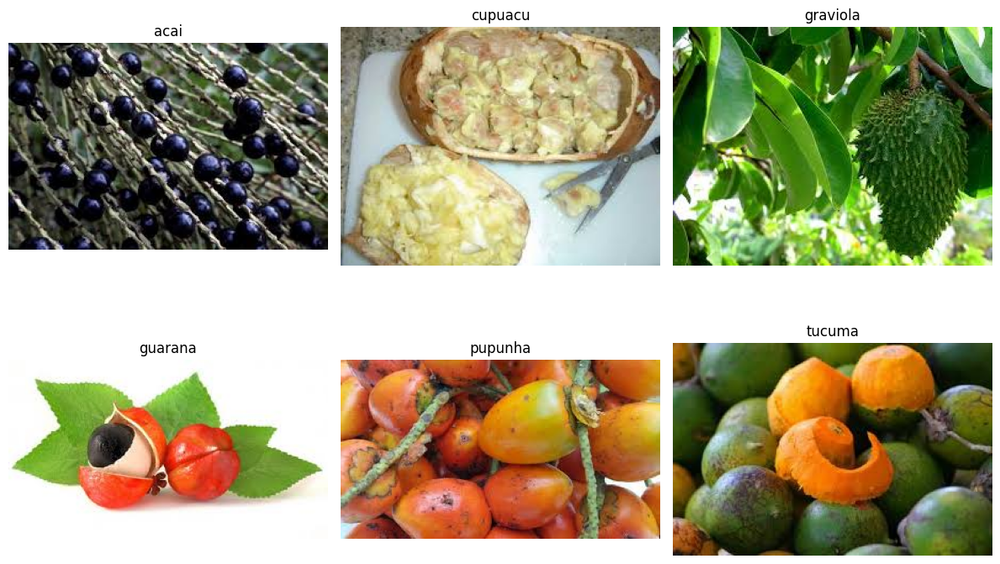

Classes found: ['acai', 'cupuacu', 'graviola', 'guarana', 'pupunha', 'tucuma']
Observation: Images vary in size, background, and lighting across classes.


In [7]:
train_path = '/content/drive/MyDrive/AI and Machine Learning/Workshop_6/FruitinAmazon/train'
test_path  = '/content/drive/MyDrive/AI and Machine Learning/Workshop_6/FruitinAmazon/test'

category_list = sorted(os.listdir(train_path))
total_categories = len(category_list)

num_cols = (total_categories + 1) // 2
figure, ax_array = plt.subplots(2, num_cols, figsize=(num_cols * 4, 8))
ax_array = ax_array.flatten()

for idx, category in enumerate(category_list):
    category_path = os.path.join(train_path, category)
    file_list = os.listdir(category_path)
    selected_img_path = os.path.join(category_path, random.choice(file_list))
    loaded_img = Image.open(selected_img_path)
    ax_array[idx].imshow(loaded_img)
    ax_array[idx].set_title(category)
    ax_array[idx].axis('off')

for remaining_idx in range(idx + 1, len(ax_array)):
    ax_array[remaining_idx].axis('off')

plt.tight_layout()
plt.show()

print(f"Classes found: {category_list}")
print("Observation: Images vary in size, background, and lighting across classes.")

2. Check for Corrupted Image: Write a script that verifies whether the image in the train
directory are valid. If any corrupted images are found, the script must remove the image from
the directory and print the message which image have been removed, if none found print ”No
Corrupted Images Found.”
• Hint:– Iterate through each class subdirectory and check if each image is valid.– Use the Image.open() function to attempt to load each image.– If the image is corrupted i.e. raises an IOError or SyntaxError, remove the image from
the directory and print f"Removed corrupted image: {image_path}".– Maintain a list of all corrupted image paths for reporti

In [8]:
damaged_files = []

for category in category_list:
    category_path = os.path.join(train_path, category)
    for filename in os.listdir(category_path):
        selected_img_path = os.path.join(category_path, filename)
        try:
            loaded_img = Image.open(selected_img_path)
            loaded_img.verify()
        except (IOError, SyntaxError):
            damaged_files.append(selected_img_path)
            os.remove(selected_img_path)
            print(f"Removed corrupted image: {selected_img_path}")

if not damaged_files:
    print("There is no corrupted image.")

There is no corrupted image.


#CHECKING CLASS BALANCE

In [9]:
class_counts = {}

for category in category_list:
    category_path = os.path.join(train_path, category)
    if os.path.isdir(category_path):
        images = [f for f in os.listdir(category_path)
                  if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        class_counts[category] = len(images)

print("\nClass Distribution:")
print("=" * 45)
print(f"{'Class Name':<25}{'Valid Image Count':>15}")
print("=" * 45)
for cls, cnt in class_counts.items():
    print(f"{cls:<25}{cnt:>15}")
print("=" * 45)


Class Distribution:
Class Name               Valid Image Count
acai                                  15
cupuacu                               15
graviola                              15
guarana                               15
pupunha                               15
tucuma                                15


#VISUALIZING RANDOM IMAGE

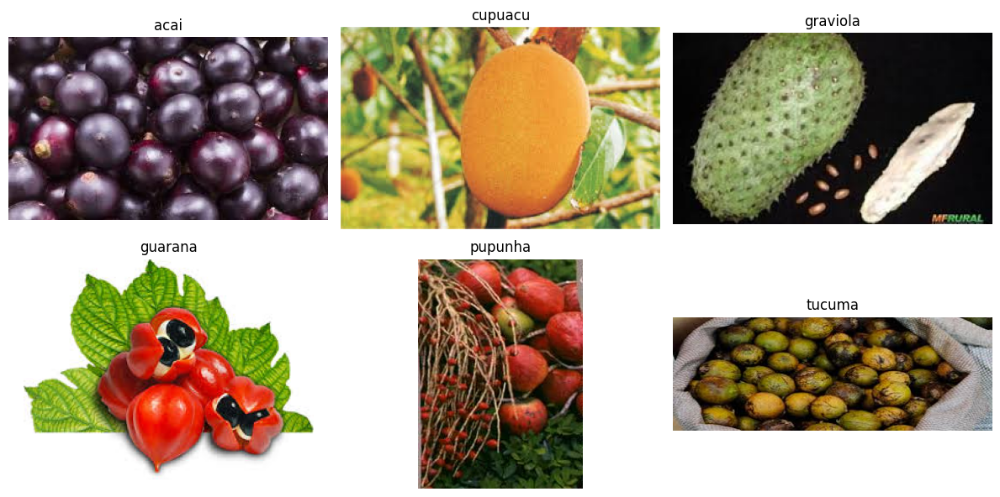

In [10]:
selected_images, selected_labels = [], []

for category in category_list:
    category_path = os.path.join(train_path, category)
    if os.path.isdir(category_path):
        file_list = [f for f in os.listdir(category_path)
                  if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        if file_list:
            selected_images.append(os.path.join(category_path, random.choice(file_list)))
            selected_labels.append(category)

num_classes = len(selected_images)
num_cols = (num_classes + 1) // 2
rows = 2

figure, ax_array = plt.subplots(rows, num_cols, figsize=(12, 6))
for idx, ax in enumerate(ax_array.flat):
    if idx < num_classes:
        loaded_img = mpimg.imread(selected_images[idx])
        ax.imshow(loaded_img)
        ax.set_title(selected_labels[idx])
        ax.axis("off")
    else:
        ax.axis("off")
plt.tight_layout()
plt.show()

#DATA PRE-PROCESSING

In [11]:
IMAGE_SIZE  = (224, 224)
BATCH_SIZE  = 32

train_ds, val_ds = keras.utils.image_dataset_from_directory(
    train_path,
    validation_split=0.2,
    subset="both",
    seed=1337,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
)

# Inspect a batch
for file_list, labels in train_ds.take(1):
    print("Images shape:", file_list.shape)
    print("Labels shape:", labels.shape)

Found 90 files belonging to 6 classes.
Using 72 files for training.
Using 18 files for validation.
Images shape: (32, 224, 224, 3)
Labels shape: (32,)


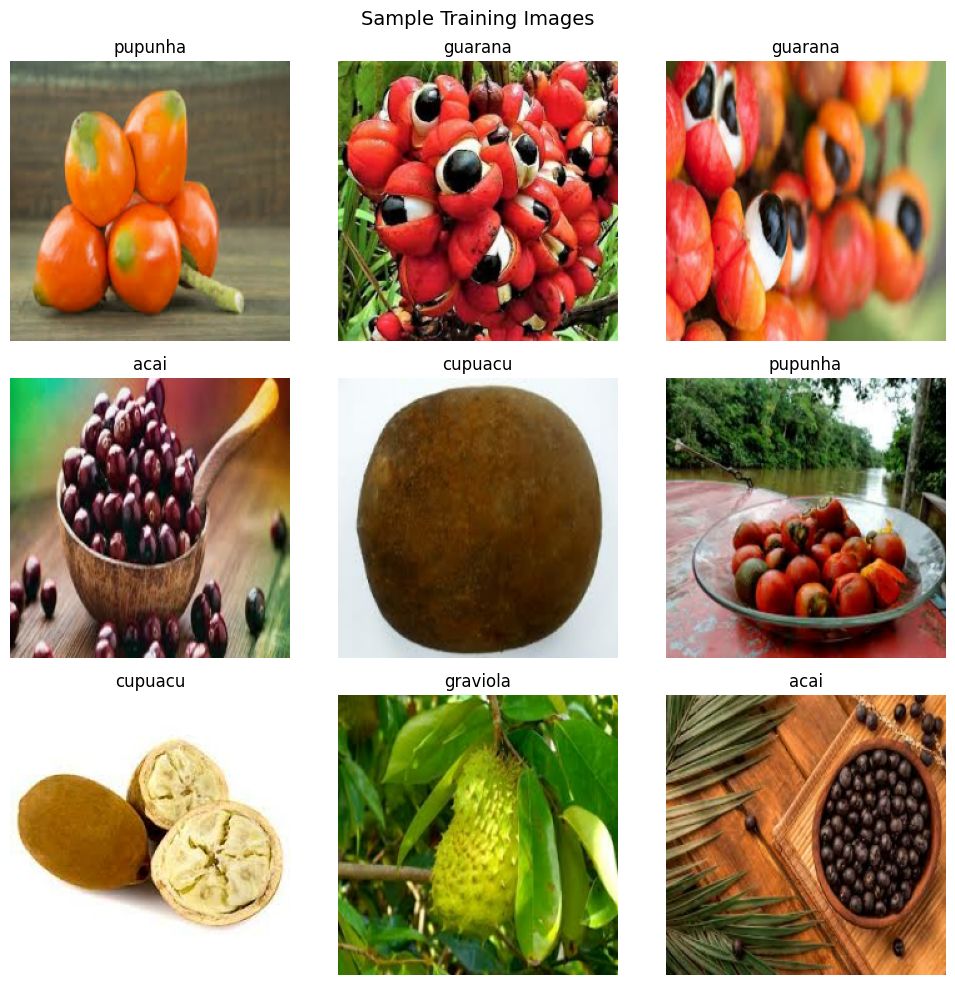

In [12]:
plt.figure(figsize=(10, 10))
for file_list, labels in train_ds.take(1):
    for idx in range(9):
        ax = plt.subplot(3, 3, idx + 1)
        plt.imshow(np.array(file_list[idx]).astype("uint8"))
        plt.title(category_list[int(labels[idx])])
        plt.axis("off")
plt.suptitle("Sample Training Images", fontsize=14)
plt.tight_layout()
plt.show()

#DATA AUGUMENTATION

In [12]:
data_augmentation_layers = [
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
    layers.RandomBrightness(0.1),
]

def data_augmentation(file_list):
    for layer in data_augmentation_layers:
        file_list = layer(file_list)
    return file_list

#VISUALIZATION AFTER DATA AUGUMENTATION

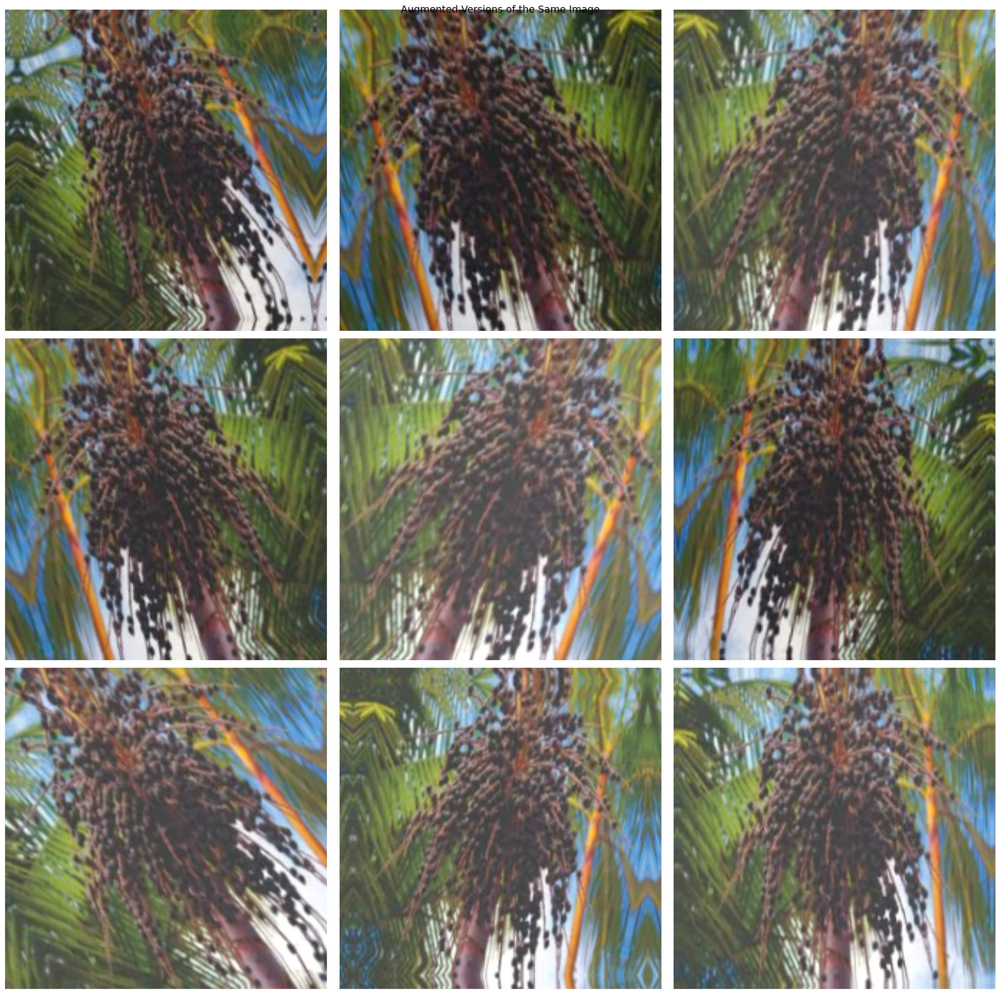

In [13]:
plt.figure(figsize=(20, 20))
for file_list, _ in train_ds.take(2):
    for idx in range(9):
        augmented = data_augmentation(file_list)
        ax = plt.subplot(3, 3, idx + 1)
        plt.imshow(np.array(augmented[0]).astype("uint8"))
        plt.axis("off")
plt.suptitle("Augmented Versions of the Same Image", fontsize=14)
plt.tight_layout()
plt.show()

#CNN with Batch Normalization and Dropout

In [14]:
input_shape = (224, 224, 3)
num_classes = len(category_list)

inputs = keras.Input(shape=input_shape)

x = data_augmentation(inputs)
x = layers.Rescaling(1./255)(x)

x = Conv2D(32, (3, 3), padding='same', activation=None)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

x = Conv2D(64, (3, 3), padding='same', activation=None)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

x = Conv2D(128, (3, 3), padding='same', activation=None)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

x = Conv2D(256, (3, 3), padding='same', activation=None)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = MaxPooling2D((2, 2))(x)
x = Dropout(0.25)(x)

x = Flatten()(x)

x = Dense(512, activation=None)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Dropout(0.5)(x)

x = Dense(256, activation=None)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Dropout(0.5)(x)

x = Dense(128, activation=None)(x)
x = BatchNormalization()(x)
x = Activation('relu')(x)
x = Dropout(0.5)(x)

outputs = Dense(num_classes, activation='softmax')(x)

model_scratch = keras.Model(inputs=inputs, outputs=outputs, name="CNN_from_scratch")
model_scratch.summary()

Model: "CNN_from_scratch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_flip (RandomFlip)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_rotation                 │ (None, 224, 224, 3)    │             0 │
│ (RandomRotation)                │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_zoom (RandomZoom)        │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ random_brightness               │ (None, 224, 224, 3)    │             0 │
│ (RandomBrightness)              │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ rescaling (Rescaling)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d (Conv2D)                 │ (None, 224, 224, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 224, 224, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation (Activation)         │ (None, 224, 224, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 112, 112, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 112, 112, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 112, 112, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_1 (Activation)       │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 56, 56, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 56, 56, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 56, 56, 128)    │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ activation_2 (Activation)       │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 28, 28, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 28, 28, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 26,249,542 (100.13 MB)

 Trainable params: 26,246,790 (100.12 MB)

 Non-trainable params: 2,752 (10.75 KB)

In [15]:
model_scratch.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [16]:
test_ds = tf.keras.utils.image_dataset_from_directory(
    test_path,
    image_size=IMAGE_SIZE,
    batch_size=BATCH_SIZE,
    shuffle=False,
    seed=123
)

Found 30 files belonging to 6 classes.


#TRAINING THE MODEL

In [17]:
checkpoint_cb = keras.callbacks.ModelCheckpoint(
    'best_scratch_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

early_stop_cb = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=20,
    restore_best_weights=True,
    verbose=1
)

history_scratch = model_scratch.fit(
    train_ds,
    epochs=250,
    validation_data=val_ds,
    callbacks=[checkpoint_cb, early_stop_cb]
)

Epoch 1/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.1198 - loss: 2.4033
Epoch 1: val_accuracy improved from None to 0.27778, saving model to best_scratch_model.keras

Epoch 1: finished saving model to best_scratch_model.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 31s 7s/step - accuracy: 0.1250 - loss: 2.3748 - val_accuracy: 0.2778 - val_loss: 1.7317
Epoch 2/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 6s/step - accuracy: 0.1748 - loss: 2.2566  
Epoch 2: val_accuracy did not improve from 0.27778
3/3 ━━━━━━━━━━━━━━━━━━━━ 29s 7s/step - accuracy: 0.1806 - loss: 2.1938 - val_accuracy: 0.0556 - val_loss: 1.8123
Epoch 3/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.2147 - loss: 2.3345
Epoch 3: val_accuracy did not improve from 0.27778
3/3 ━━━━━━━━━━━━━━━━━━━━ 18s 5s/step - accuracy: 0.2222 - loss: 2.3158 - val_accuracy: 0.0556 - val_loss: 1.8633
Epoch 4/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.1997 - loss: 1.8635
Epoch 4: val_accuracy did not improve from 0.27778
3/3 ━━━━━━━━━━━━━━━━━━━━

#VISUALIZING TRAINING CURVES

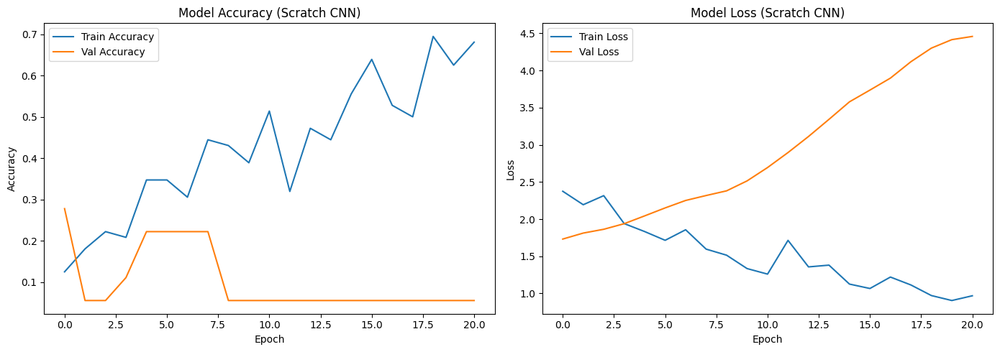

In [18]:
figure, ax_array = plt.subplots(1, 2, figsize=(14, 5))

ax_array[0].plot(history_scratch.history['accuracy'],     label='Train Accuracy')
ax_array[0].plot(history_scratch.history['val_accuracy'], label='Val Accuracy')
ax_array[0].set_title('Model Accuracy (Scratch CNN)')
ax_array[0].set_xlabel('Epoch')
ax_array[0].set_ylabel('Accuracy')
ax_array[0].legend()

ax_array[1].plot(history_scratch.history['loss'],     label='Train Loss')
ax_array[1].plot(history_scratch.history['val_loss'], label='Val Loss')
ax_array[1].set_title('Model Loss (Scratch CNN)')
ax_array[1].set_xlabel('Epoch')
ax_array[1].set_ylabel('Loss')
ax_array[1].legend()

plt.tight_layout()
plt.show()

#EVALUATING ON TEST SET

In [19]:
test_loss, test_acc = model_scratch.evaluate(test_ds)
print(f"Scratch CNN  –  Test Loss: {test_loss:.4f}  |  Test Accuracy: {test_acc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step - accuracy: 0.2000 - loss: 1.8432
Scratch CNN  –  Test Loss: 1.8432  |  Test Accuracy: 0.2000


In [20]:
model_scratch.save('cnn_scratch_ws6.keras')
print("Saved as cnn_scratch_ws6.keras")

Saved as cnn_scratch_ws6.keras


#Classification Report

In [21]:
y_true_s, y_pred_s = [], []
for file_list, labels in test_ds:
    preds = model_scratch.predict(file_list, verbose=0)
    y_pred_s.extend(np.argmax(preds, axis=1))
    y_true_s.extend(labels.numpy())

print("Classification Report – Scratch CNN")
print(classification_report(y_true_s, y_pred_s, target_names=category_list))

Classification Report – Scratch CNN
              precision    recall  f1-score   support

        acai       0.00      0.00      0.00         5
     cupuacu       1.00      0.20      0.33         5
    graviola       0.00      0.00      0.00         5
     guarana       0.00      0.00      0.00         5
     pupunha       0.00      0.00      0.00         5
      tucuma       0.17      1.00      0.29         5

    accuracy                           0.20        30
   macro avg       0.20      0.20      0.10        30
weighted avg       0.20      0.20      0.10        30



/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.12/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


#Task - 2:
To - Do:
• Implement transfer learning using a pre-trained model trained on ImageNet weights, freeze the
layers of the model, and fit it only on the output layer to classify the fruits dataset.
• Evaluate the model’s performance and generate an inference output and classification report.
• Did the performance improved compared to training from scratch.
Expected Deliverables:
• Trained Model: A trained model with the frozen layers and fine-tuned output layer.
• Inference Output: Predicted class labels for the validation dataset.
• Classification Report: A detailed classification report showing the performance of the model for
each class.

#Preparing Datasets For VGG16

In [22]:
from tensorflow.keras.applications.vgg16 import preprocess_input

def preprocess_vgg(image, label):
    image = tf.cast(image, tf.float32)
    image = preprocess_input(image)
    return image, label

train_ds_vgg = train_ds.map(preprocess_vgg)
val_ds_vgg   = val_ds.map(preprocess_vgg)
test_ds_vgg  = test_ds.map(preprocess_vgg)

In [23]:
base_model = VGG16(weights='imagenet', include_top=False, input_shape=(224, 224, 3))

# Freeze all base layers
for layer in base_model.layers:
    layer.trainable = False

print(f"VGG16 base layers: {len(base_model.layers)}")
print(f"Trainable layers : {sum(1 for l in base_model.layers if l.trainable)}")
base_model.summary()

VGG16 base layers: 19
Trainable layers : 0


Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

In [24]:
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
x = Dropout(0.5)(x)
x = Dense(256, activation='relu')(x)
x = Dropout(0.3)(x)
outputs_vgg = Dense(num_classes, activation='softmax')(x)

model_vgg = Model(inputs=base_model.input, outputs=outputs_vgg, name="VGG16_TransferLearning")
model_vgg.summary()

Model: "VGG16_TransferLearning"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 224, 224, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 224, 224, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 112, 112, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 112, 112, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 112, 112, 128)  │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 56, 56, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 56, 56, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 56, 56, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 28, 28, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 28, 28, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 28, 28, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 14, 14, 512)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 14, 14, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 7, 7, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 1024)           │       525,312 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 256)            │       262,400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 256)            │             0 │
├─────────────────────────────────┼────────────────────────┼─────────────

 Total params: 15,503,942 (59.14 MB)

 Trainable params: 789,254 (3.01 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [25]:
model_vgg.compile(
    optimizer=Adam(learning_rate=1e-4),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

#Train - Only the custom head layers update

In [27]:
checkpoint_vgg = keras.callbacks.ModelCheckpoint(
    'best_vgg16_model.keras',
    monitor='val_accuracy',
    save_best_only=True,
    verbose=1
)

early_stop_vgg = keras.callbacks.EarlyStopping(
    monitor='val_loss',
    patience=10,
    restore_best_weights=True,
    verbose=1
)

history_vgg = model_vgg.fit(
    train_ds_vgg,
    epochs=250,
    validation_data=val_ds_vgg,
    callbacks=[checkpoint_vgg, early_stop_vgg]
)

Epoch 1/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 15s/step - accuracy: 0.1962 - loss: 8.6248 
Epoch 1: val_accuracy improved from None to 0.22222, saving model to best_vgg16_model.keras

Epoch 1: finished saving model to best_vgg16_model.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 63s 21s/step - accuracy: 0.1667 - loss: 8.5810 - val_accuracy: 0.2222 - val_loss: 4.0828
Epoch 2/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 12s/step - accuracy: 0.1997 - loss: 6.1016 
Epoch 2: val_accuracy did not improve from 0.22222
3/3 ━━━━━━━━━━━━━━━━━━━━ 63s 18s/step - accuracy: 0.2083 - loss: 6.2519 - val_accuracy: 0.2222 - val_loss: 3.5233
Epoch 3/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - accuracy: 0.1788 - loss: 7.2758 
Epoch 3: val_accuracy improved from 0.22222 to 0.33333, saving model to best_vgg16_model.keras

Epoch 3: finished saving model to best_vgg16_model.keras
3/3 ━━━━━━━━━━━━━━━━━━━━ 53s 16s/step - accuracy: 0.2083 - loss: 6.7819 - val_accuracy: 0.3333 - val_loss: 3.0610
Epoch 4/250
3/3 ━━━━━━━━━━━━━━━━━━━━ 0s 11s/step - a

#PLOTTING TRAINING CURVES

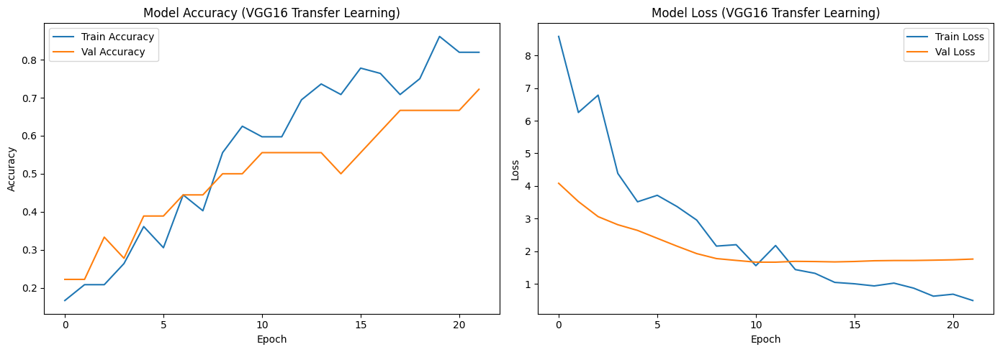

In [28]:
fig, axes = plt.subplots(1, 2, figsize=(14, 5))

axes[0].plot(history_vgg.history['accuracy'],     label='Train Accuracy')
axes[0].plot(history_vgg.history['val_accuracy'], label='Val Accuracy')
axes[0].set_title('Model Accuracy (VGG16 Transfer Learning)')
axes[0].set_xlabel('Epoch')
axes[0].set_ylabel('Accuracy')
axes[0].legend()

axes[1].plot(history_vgg.history['loss'],     label='Train Loss')
axes[1].plot(history_vgg.history['val_loss'], label='Val Loss')
axes[1].set_title('Model Loss (VGG16 Transfer Learning)')
axes[1].set_xlabel('Epoch')
axes[1].set_ylabel('Loss')
axes[1].legend()

plt.tight_layout()
plt.show()

#EVALUATING ON TEST SET

In [29]:
vgg_loss, vgg_acc = model_vgg.evaluate(test_ds_vgg)
print(f"VGG16 Transfer  –  Test Loss: {vgg_loss:.4f}  |  Test Accuracy: {vgg_acc:.4f}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 17s 17s/step - accuracy: 0.7333 - loss: 1.7997
VGG16 Transfer  –  Test Loss: 1.7997  |  Test Accuracy: 0.7333


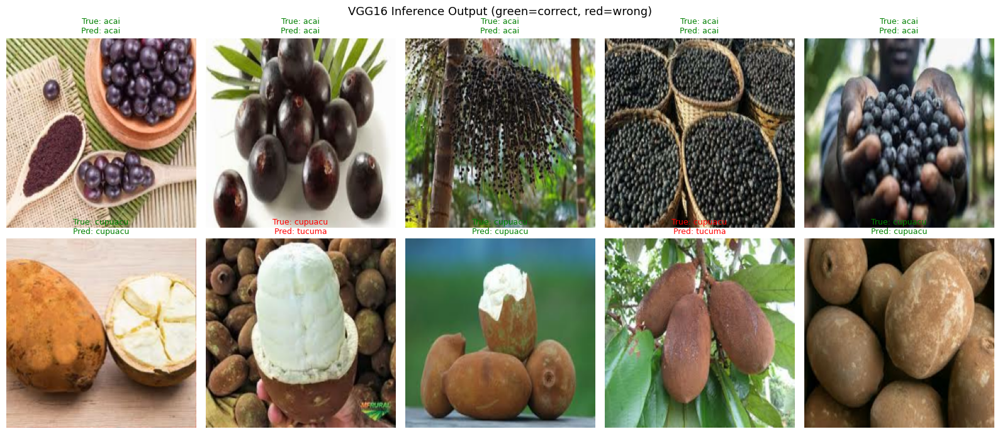

In [30]:
for images_raw, labels in test_ds.take(1):
    images_proc, _ = preprocess_vgg(images_raw, labels)
    preds = model_vgg.predict(images_proc, verbose=0)
    pred_labels = np.argmax(preds, axis=1)

    fig, axes = plt.subplots(2, 5, figsize=(16, 7))
    for i, ax in enumerate(axes.flat):
        if i < len(images_raw):
            ax.imshow(images_raw[i].numpy().astype("uint8"))
            true_cls = category_list[labels[i]]
            pred_cls = category_list[pred_labels[i]]
            color    = 'green' if true_cls == pred_cls else 'red'
            ax.set_title(f"True: {true_cls}\nPred: {pred_cls}", color=color, fontsize=9)
            ax.axis('off')
    plt.suptitle("VGG16 Inference Output (green=correct, red=wrong)", fontsize=13)
    plt.tight_layout()
    plt.show()

#Classification Report

In [31]:
y_true_v, y_pred_v = [], []
for images, labels in test_ds_vgg:
    preds = model_vgg.predict(images, verbose=0)
    y_pred_v.extend(np.argmax(preds, axis=1))
    y_true_v.extend(labels.numpy())

print("Classification Report – VGG16 Transfer Learning")
print(classification_report(y_true_v, y_pred_v, target_names=category_list))

Classification Report – VGG16 Transfer Learning
              precision    recall  f1-score   support

        acai       1.00      1.00      1.00         5
     cupuacu       1.00      0.60      0.75         5
    graviola       1.00      1.00      1.00         5
     guarana       1.00      1.00      1.00         5
     pupunha       0.33      0.20      0.25         5
      tucuma       0.33      0.60      0.43         5

    accuracy                           0.73        30
   macro avg       0.78      0.73      0.74        30
weighted avg       0.78      0.73      0.74        30



In [32]:
model_vgg.save('vgg16_transfer_ws6.keras')
print("Saved as vgg16_transfer_ws6.keras")

Saved as vgg16_transfer_ws6.keras


#Comparison – Scratch CNN vs VGG16 Transfer Learning

In [33]:
print("=" * 55)
print(f"{'Model':<30} {'Test Accuracy':>12} {'Test Loss':>10}")
print("=" * 55)
print(f"{'Scratch CNN (Worksheet-6)':<30} {test_acc:>12.4f} {test_loss:>10.4f}")
print(f"{'VGG16 Transfer Learning':<30} {vgg_acc:>12.4f} {vgg_loss:>10.4f}")
print("=" * 55)

improvement = (vgg_acc - test_acc) * 100
print(improvement)

Model                          Test Accuracy  Test Loss
Scratch CNN (Worksheet-6)            0.2000     1.8432
VGG16 Transfer Learning              0.7333     1.7997
53.3333346247673


#TUTORIAL-6

EXERCISE - 1

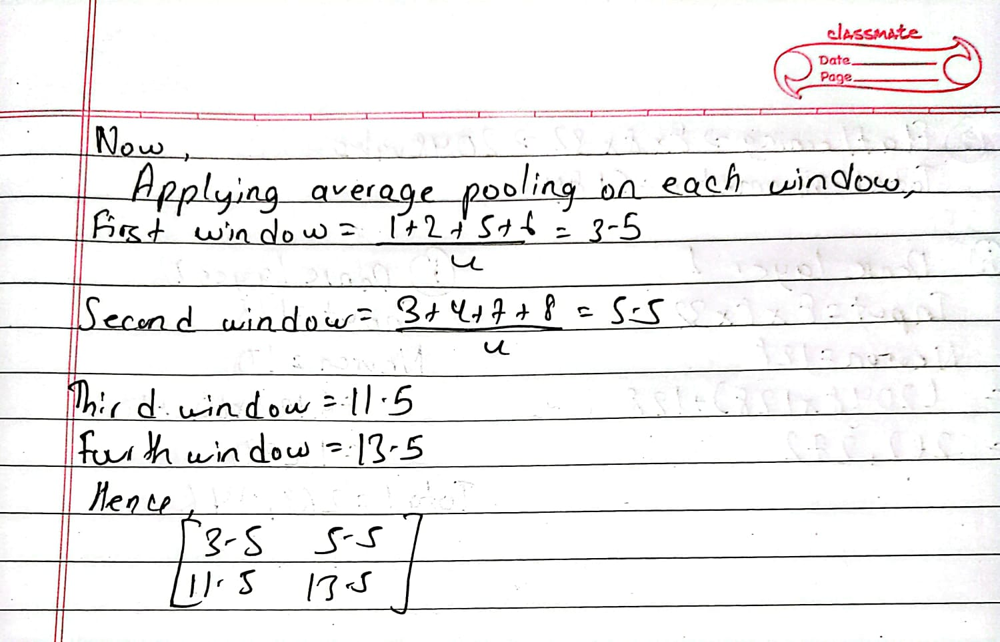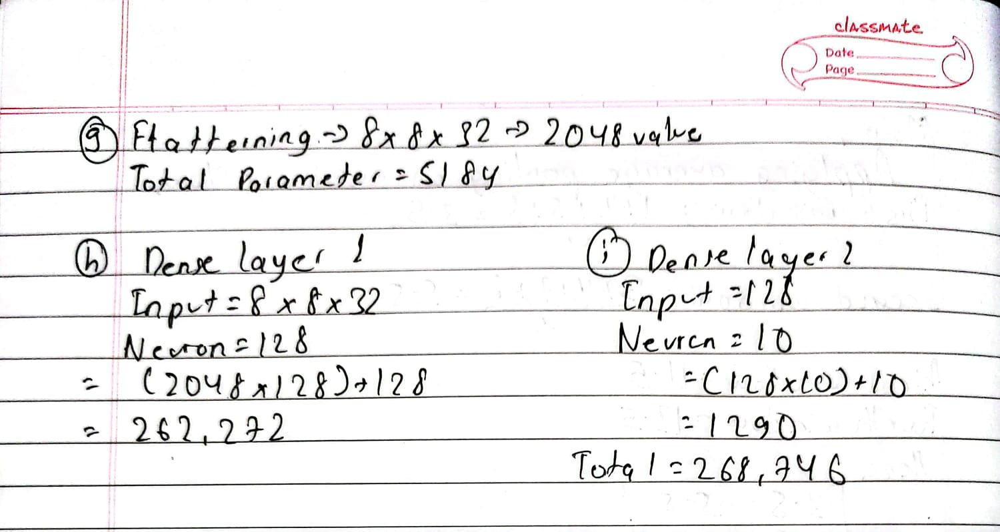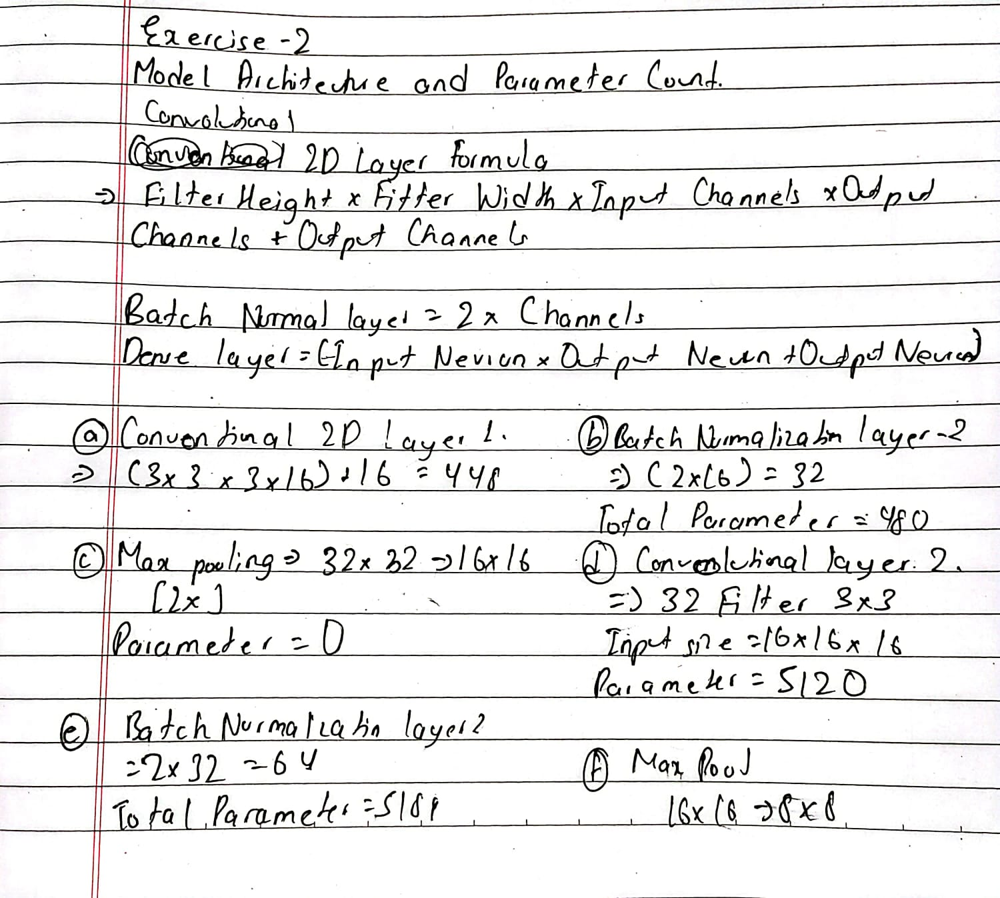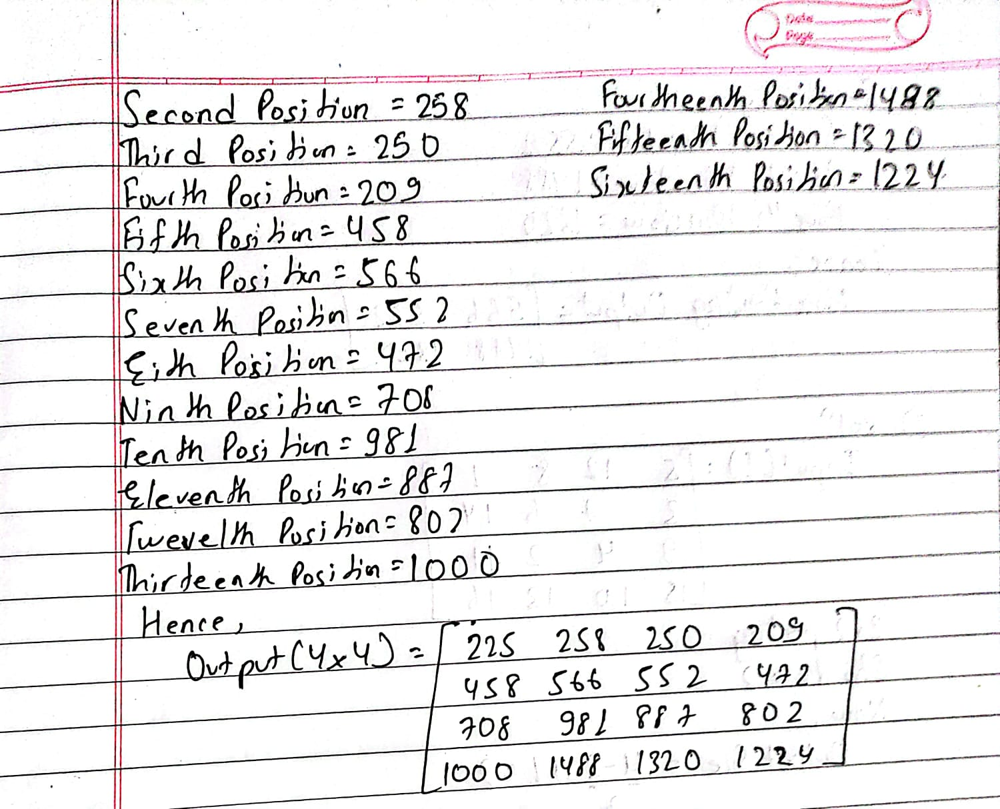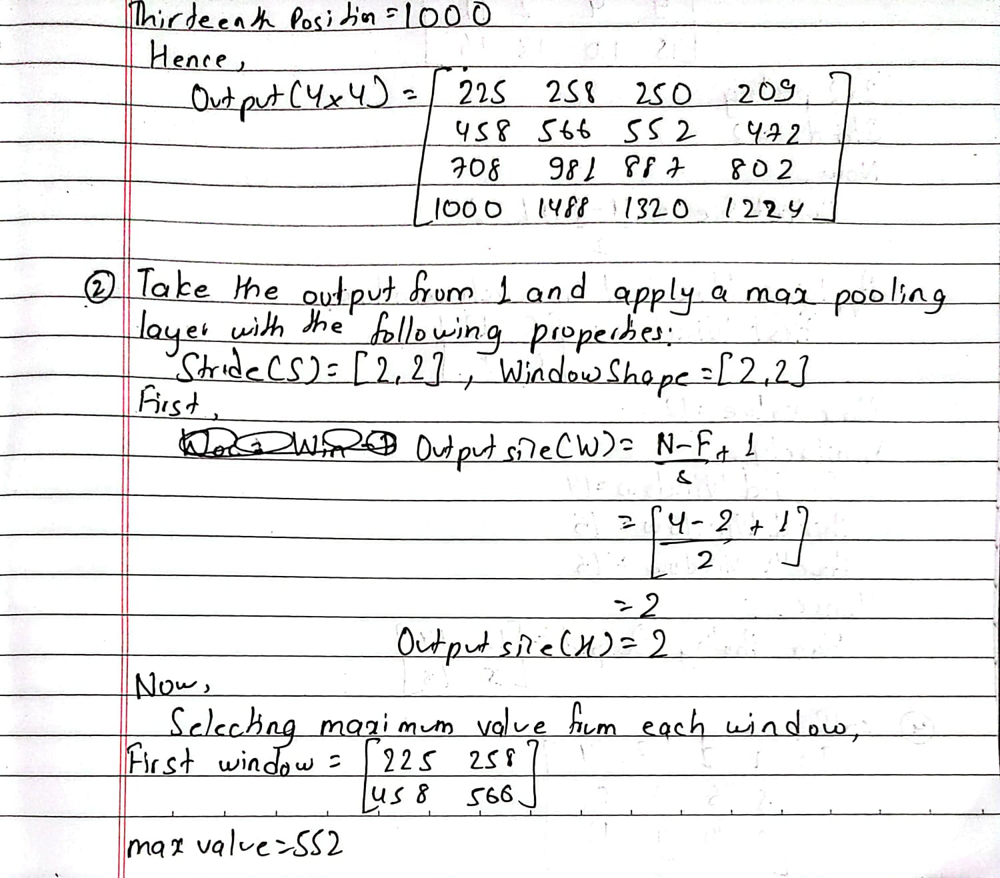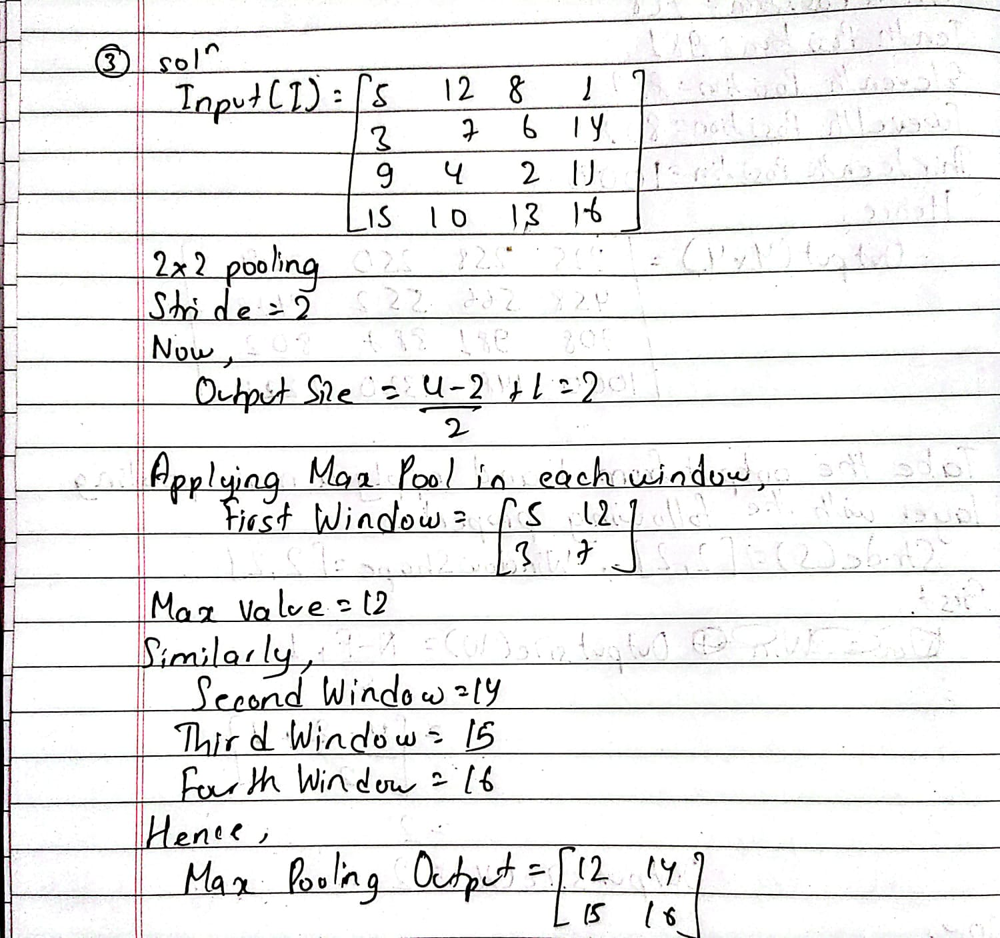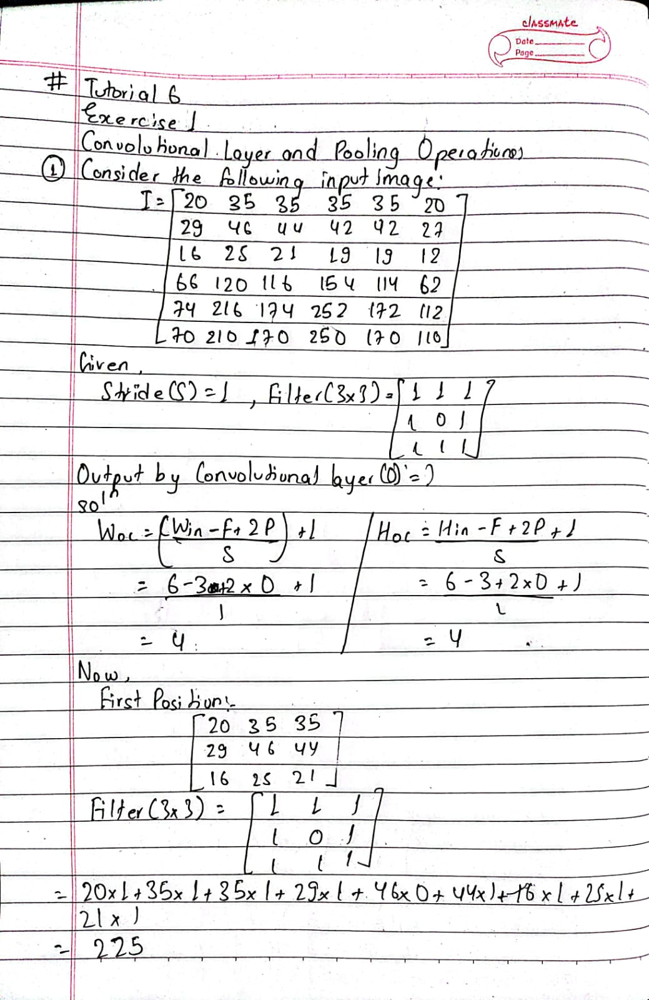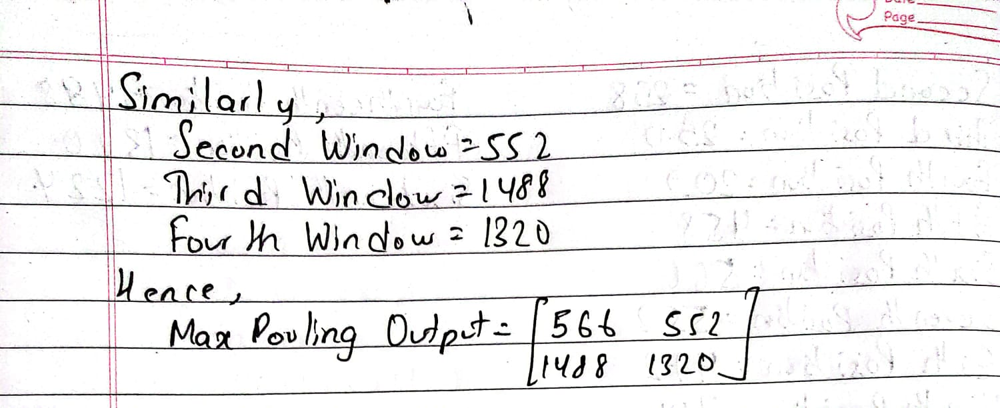